# Thông tin chung


* Thành viên nhóm:
  * Võ Phạm Tuấn Dũng - 2010013
* Bộ dữ liệu:
  * [***Weather Image Recognizer***](https://drive.google.com/drive/folders/1I1tvU9OR4__qPcEaglnOf0u-m_vYWAPp?usp=sharing
)
  * Kích thước: 615 MB
  * Nguồn: Kaggle
  * Bộ dữ liệu gồm 11 lớp, tương ứng với các kiểu thời tiết khác nhau.
* Backbone:
  * [***MobileNetV1*** (https://arxiv.org/abs/1704.04861)](https://arxiv.org/abs/1801.04381)
* Nội dung bài báo cáo tập trung vào các vấn đề sau:
  * Nghiên cứu kiến trúc MobileNetV1
  * Khám phá quá trình feature extraction
  * Transfer learning với bộ dataset Weather Image Recognizer




# I. Giới thiệu backbone


## 1.1 Động lực ra đời của MobileNet


Để triển khai các ứng dụng AI trên các thiết bị mobile, IoT. chúng ta cần xem xét về tài nguyên của thiết bị để lựa chọn model phù hợp. Những mô hình ưa chuộng được sử dụng thường là những model có số lượng tính toán ít và độ chính xác cao. MobileNet là một trong những lớp mô hình được tạo ra để phù hợp với nhu cầu này.

## 1.2 Depthwise Separable Convolution
Bản chất ẩn chứa đằng sau các mạng MobileNet là cơ chế **Depthwise Separable Convolution**. Cơ chế này giúp giảm nhẹ độ phức tạp tính toán của phép tích chập, từ đó khiến ứng dụng AI có thể triển khai trên các thiết bị có tài nguyên tính toán thấp.



* Ta có thể nhận thấy trong một kiến trúc mạng CNN phổ biến, độ sâu của output sau mỗi lớp Convolution Layer có xu hướng tăng từ trái qua phải theo kiến trúc mô hình. Từ độ sâu ban đầu ảnh là 3, sau nhiều lớp, ta thu được một tensor có chiều sâu lên tới 3 chữ số. Do đó độ sâu (depth) là một trong những nguyên nhân chính dẫn tới sự gia tăng số lượng tham số của mô hình.
* Depthwise Separable Convolution (tích chập tách biệt chiều sâu) sẽ tìm cách loại bỏ sự phụ thuộc vào độ sâu khi tích chập mà vẫn tạo ra được một output shape có kích thước tương đương so với tích chập thông thường, tạm gọi là Standard Convolution. Độ phức tạp tính toán của Depthwise Separable Convolution là nhỏ hơn so với Standard Convolution.

* Về cơ chế Depthwise Separable Convolution, thay vì áp dụng phép Standard Convolution một tensor 3 chiều $X$ (kích thước $H × H ×D$) với $N$ kernel (có kích thước $K \times K \times D$) để thu được output là tensor Y (kích thước $L \times L \times N$), ta phân tách thành hai phép biến đổi liên tiếp sau:
  * **Depthwise Convolution**: Tạm thời chưa quan tâm đến số kernel, ta phân tách 1 kernel $K \times K \times D$ thành $D$ lát cắt 2 chiều. Do số lát của kernel bằng với số channel của tensor $X$, ta tiến hành thực hiện $D$ phép Standard Convolution 2 chiều cho từng channel của $X$ với từng lát cắt tương ứng. Kết quả, ta thu được $D$ channel từ $D$ phép tích chập 2 chiều, chồng lại ta được 1 tensor có kích thước độ sâu là $D$.
  
  * **Pointwise Convolution**: Thực hiện phép Standard Convolution cho đầu ra của phép biến đổi trên với N kernel kích thước $1 \times 1 \times D$. Đầu ra của phép biến đổi này là một tensor có kích thước chiều dài, chiều rộng giống tensor đầu vào, nhưng có chiều sâu bằng với số kernel.
  * **Ảnh minh họa**:

  <img src = "https://www.researchgate.net/publication/357973065/figure/fig2/AS:1127438167879680@1645813614280/Depthwise-separable-convolution-of-the-MobileNet-which-factorizes-the-convolution-into.ppm">
  
* Ngiên cứu bản chất toán của phép biến đổi:
  * Ở phép Depthwise Convolution, mục đích là bỏ đi yếu tố độ sâu $N$ của output mong muốn để giảm nhẹ kích thước tính toán. Tổng số phép toán trong phép biến đổi này là $ n_{dwc} = H^{2} \cdot K^{2} \cdot D$.
  * Pointwise Convolution: kích thước chiều dài, chiều rộng $1 \times 1$, mục đích là giữ nguyên kích thước chiều dài, chiều rộng như tensor đầu vào, nhưng vẫn có thể tùy chỉnh độ sâu của tensor đầu ra. Số phép toán của phép biến đổi này là: $n_{pwc} = D \cdot N \cdot H^{2}$.
  * Như vậy, gọi $Y'$ là đầu ra của tensor $X$ sau hai phép biến đổi trên. Khi đó, phép biến đổi Depthwise Convolution nhằm đảm bảo kích thước chiều dài, chiều rộng của tensor $Y'$ đầu ra là $L$, mà chưa quan tâm đến chiều sâu của $Y'$. Phép biến đổi Depthwise Convolution nhằm đảm bảo kích thước chiều sâu của tensor đầu ra là $N$. Như vậy, ta đã tách vấn đề kích thước output thành hai phần: phần đầu là xử lí về chiều dài và chiều rộng, phần sau là xử lí độ lớn về chiều sâu.
  * Tổng số phép toán của Depthwise Separable Convolution, tức tổng hai phép biến đổi trên là $n_{dwc} + n_{pwc}$. Nếu ta áp dụng dụng phép biến đổi thông thường Standard Convolution cho tensor $X$ thì số phép toán tổng cộng là: $$ n_{sc} = H^{2} \cdot K^{2} \cdot D \cdot N = H^{2} D \cdot K^2  N> H^{2} D \cdot (K+N) = n_{pwc} + n_{dwc}$$ Như vậy, ta đã chuyển giảm mạnh độ phức tạp tính toán bằng cách chuyển phép nhân thành phép cộng. Ngoài ra ta có: $$ \frac{n_{dwc} + n_{pwc}}{n_{sc}} = \frac{1}{K^2} + \frac{1}{N} \approx \frac{1}{K^2} (N → +∞)$$
  * Từ biểu thức trên ta thấy, khi chuyển từ phép Standard Convolution sang Depthwise Separable Convolution, độ phức tạp đã giảm đi bình phương kích thước chiều dài của kernel, hay tổng số pixel trên mỗi channel của kernel. Nếu ta sử dụng kernel $3 \times 3 \times D$ thì độ phức tạp tính toán giảm đi tới 9 lần.




## 1.3 Kiến trúc MobileNetV1


### 1.3.1 Sơ đồ kiến trúc tổng quát

* Về tổng thể, backbone của MobileNetV1 gồm có 5 phần chính. Phần đầu tiên chỉ có 3 lớp chưa sử dụng cơ chế Depthwise Separable Convolution. Phần cơ chế này được hiện thực ở trong các khối đơn vị MobileNet block.
* Từ phần thứ hai đến phần thứ năm, mỗi phần được cấu tạo từ nhiều MobileNet block ghép lại với nhau, được thể hiện ở phần bên trái hình dưới đây. Chú ý: tham số f là số filter của lớp convolution, k là kích thước kernel, s là stride, p là padding. Kí hiệu p:s có nghĩa là thực hiện chiến lược Same Padding nhằm đảm bảo kích thước channel của tensor đầu ra bằng với kích thước channel của tensor đầu vào.


<img src="https://raw.githubusercontent.com/Machine-Learning-Tokyo/CNN-Architectures/master/Implementations/MobileNet/MobileNet_diagram.svg?sanitize=true">

### 1.3.2 MobileNet Block


* Quan sát hình trên ta thấy, mỗi MobileNet block được đặc trưng bởi hai tham số f, s. Trong đó: f là

* Về chi tiết, mỗi *Mobilenet block* gồm có 6 layers liên tiếp nhau như sau:
    * 3x3 *Depth Wise Convolution* layer
    * Batch Normalization* layer
    * Rectified Linear Unit (ReLU) activation layer
    * 1x1 Convolutional layer (Pointwise Convolution Layer)
    * Batch Normalization layer
    * Rectified Linear Unit (ReLU) activation layer
* Hình minh họa:
<img src=https://raw.githubusercontent.com/Machine-Learning-Tokyo/DL-workshop-series/master/Part%20I%20-%20Convolution%20Operations/images/MobileNet/MobileNet_block.png width="150">


### 1.3.3 Width Multiplier và Resolution Multiplier



* Thin Multiplier:
  * Tham số $\alpha$: điều khiển số lượng channel của kernel tại lớp Standard Convolution, Pointwise Convolution. Số channel ở mỗi kernel sẽ chỉ được giữ lại tỉ lệ là $\alpha$ so với ban đầu, do đó độ dộ sâu của kernel sẽ giảm đi. Vì thế hệ số này được gọi là Thin Multiplier.
  * Giá trị $\alpha$ nằm trong đoạn [0,1]. Chúng ta tiến hành lấy giá trị $\alpha$ lần lượt là 0.25, 0.5, 0.75, 1. Đối với trường hợp $\alpha$ = 1 thì đó chính là mạng MobileNet ban đầu.


* 1.3.2.1 Width Multiplier
  * Tham số $rho$: Điều khiển kích thước chiều dài, chiều rộng (độ phân giải) của ảnh đầu vào của MobileNet. Độ phân giải của ảnh đầu vào sẽ được nhân với hằng số này.
  * Giá trị rho cũng nằm trong đoạn [0,1]. Chúng ta sử dụng ảnh có kích thước là 224 x224 (độ phân giải gốc, tương ứng với $rho$ = 1). Vậy các kích thước của ảnh được giảm tương ứng sẽ là 192x192, 160x160, 128x128.

## 1.4 Xây dựng MobileNetV1 bằng Keras Functional API

**Chọn tham số $\alpha, rho$ và định nghĩa hàm tạo MobileNet Block**

In [ ]:
from tensorflow.keras.layers import Input, DepthwiseConv2D, \
     Conv2D, BatchNormalization, ReLU, AveragePooling2D, Flatten, Dense
from tensorflow.keras import Model

alpha = 1
rho = 1

def mobilenet_block(m, filters, strides):
    filters *= rho
    m = DepthwiseConv2D(kernel_size=3, strides=strides, padding='same')(m)
    m = BatchNormalization()(m)
    m = ReLU()(m)
    m = Conv2D(filters=filters, kernel_size=1, strides=1, padding='same')(m)
    m = BatchNormalization()(m)
    m = ReLU()(m)
    return m

**Xây dựng phần đầu tiên**

In [ ]:
input_shape = (224 * alpha, 224 * alpha, 3)

input = Input(input_shape)
m = Conv2D(filters=32, kernel_size=3, strides=2, padding='same')(input)
m = BatchNormalization()(m)
m = ReLU()(m)

**Xây dựng phần thứ hai gồm 3 MobileNet block**

In [ ]:
m = mobilenet_block(m, filters=64, strides=1)
m = mobilenet_block(m, filters=128, strides=2)
m = mobilenet_block(m, filters=128, strides=1)

**Xây dựng phần thứ ba gồm 3 MobileNet block**

In [ ]:
m = mobilenet_block(m, filters=256, strides=2)
m = mobilenet_block(m, filters=256, strides=1)
m = mobilenet_block(m, filters=512, strides=2)

**Xây dựng phần thứ tư gồm 5 MobileNet block**

In [ ]:
for _ in range(5): m = mobilenet_block(m, filters=512, strides=1)

**Phần cuối cùng của backbone gồm 5 block**

In [ ]:
m = mobilenet_block(m, filters=1024, strides=2)
m = mobilenet_block(m, filters=1024, strides=1)

**Lớp Softmax**

In [ ]:
m = AveragePooling2D(pool_size=7, strides=1)(m)
output = Dense(units=1000, activation='softmax')(m)
my_model = Model(inputs=input, outputs=output)

**Khảo sát mô hình vừa xây dựng**

In [ ]:
my_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_43 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_120 (Conv2D)         (None, 112, 112, 32)      896       
                                                                 
 batch_normalization_230 (Ba  (None, 112, 112, 32)     128       
 tchNormalization)                                               
                                                                 
 re_lu_203 (ReLU)            (None, 112, 112, 32)      0         
                                                                 
 depthwise_conv2d_110 (Depth  (None, 112, 112, 32)     320       
 wiseConv2D)                                                     
                                                                 
 batch_normalization_231 (Ba  (None, 112, 112, 32)     128 

* Nhận xét:
  * Số lượng tham số của các lớp Pointwise Convolution là rất lớn so với số lượng tham số của các lớp còn lại. Theo bài báo của người phát minh ra MobileNet, 95% phép tính toán là nằm ở phép Pointwise Convolution.
  * Nhìn chung, số lượng tham số của mạng MobileNet là tương đối nhỏ so với số lượng tham số của kiến trúc mạng nổi tiếng khác như VGG, ResNet.
  * Đặc biệt, trong kiến trúc backbone của MobileNet, không hề có bất kì lớp pooling như một số kiến trúc mạng nổi tiếng khác.
  * Mô hình mà ta vừa tạo có hai tham số multiplier là 1. Trong các dự án thực tế, các tham số này sẽ được chọn nhỏ hơn 1, chẳng hạn như pre-trained model trên tập dữ liệu của tập ImageNet. Nếu ta so sánh số lượng tham số cần học của model này sẽ ít hơn model mà ta vừa xây dựng.

# II. Chuẩn bị dữ liệu

## 2.1 Tải dữ liệu từ kaggle

In [ ]:
!pip install -q kaggle
# import os; os.makedirs('/root/.kaggle')
with open("/root/.kaggle/kaggle.json", "w") as file:
    file.write('{"username":"dngvphmtun","key":"6e165f27ceb6975406051e1e6769626a"}')
!kaggle datasets download -d jehanbhathena/weather-dataset
!unzip \*.zip  && rm *.zip

## 2.2 Import các module cần thiết

In [ ]:
# Basic
import os, glob, itertools, random, pickle
import numpy as np, pandas as pd

# Data Viz
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# Tensorflow for machine learning
import tensorflow as tf
import tensorflow.keras.utils as utils
import tensorflow.keras.applications as app
import tensorflow.keras.layers as layers
import tensorflow.keras as keras
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout
from keras.models import load_model, Model

# Callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping

# Classification models
from tensorflow.keras.applications import MobileNet, MobileNetV2, VGG16

#Metrics
from sklearn.metrics import confusion_matrix, classification_report



## 2.3 Khảo sát class distribution

In [ ]:
path_to_data = os.path.join(os.getcwd(), 'dataset')
class_names = list(filter(lambda f: os.path.isdir(os.path.join(path_to_data, f)), os.listdir(path_to_data)))
class_names = sorted(class_names)
num_classes = len(class_names)
print(f"Class Names: \n{class_names}")
print(f"Total Number of Classes : {num_classes}")

class_dis = [len(os.listdir(path_to_data + f"/{name}")) for name in class_names]
lk_dis = dict(zip(class_names, class_dis))
print(f"\nClass Distribution : \n{lk_dis}")

Class Names: 
['dew', 'fogsmog', 'frost', 'glaze', 'hail', 'lightning', 'rain', 'rainbow', 'rime', 'sandstorm', 'snow']
Total Number of Classes : 11

Class Distribution : 
{'dew': 698, 'fogsmog': 851, 'frost': 475, 'glaze': 639, 'hail': 591, 'lightning': 377, 'rain': 512, 'rainbow': 232, 'rime': 1160, 'sandstorm': 692, 'snow': 621}


In [ ]:


fig = px.pie(names=class_names, values=class_dis, width=600)
fig.update_layout({"title":{'text':"Class Distribution","x":0.5}})
fig.show()

In [ ]:
fig = px.bar(x=class_names,y=class_dis,title='Class Frequency')
fig.update_layout({'title':{"x":0.1}})
fig.show()

* Nhận xét: Tập dữ liệu bị ***imbalanced***, số lượng ảnh được gán nhãn *rime* có sự chênh lệch lớn với số lượng ảnh được gán nhãn *rainbow*. Do đó trước khi huấn luyện, chúng ta phải thực hiện bước Data Augmentation.

## 2.4 Hiển thị một số ảnh từ dataset

Found 6862 files belonging to 11 classes.


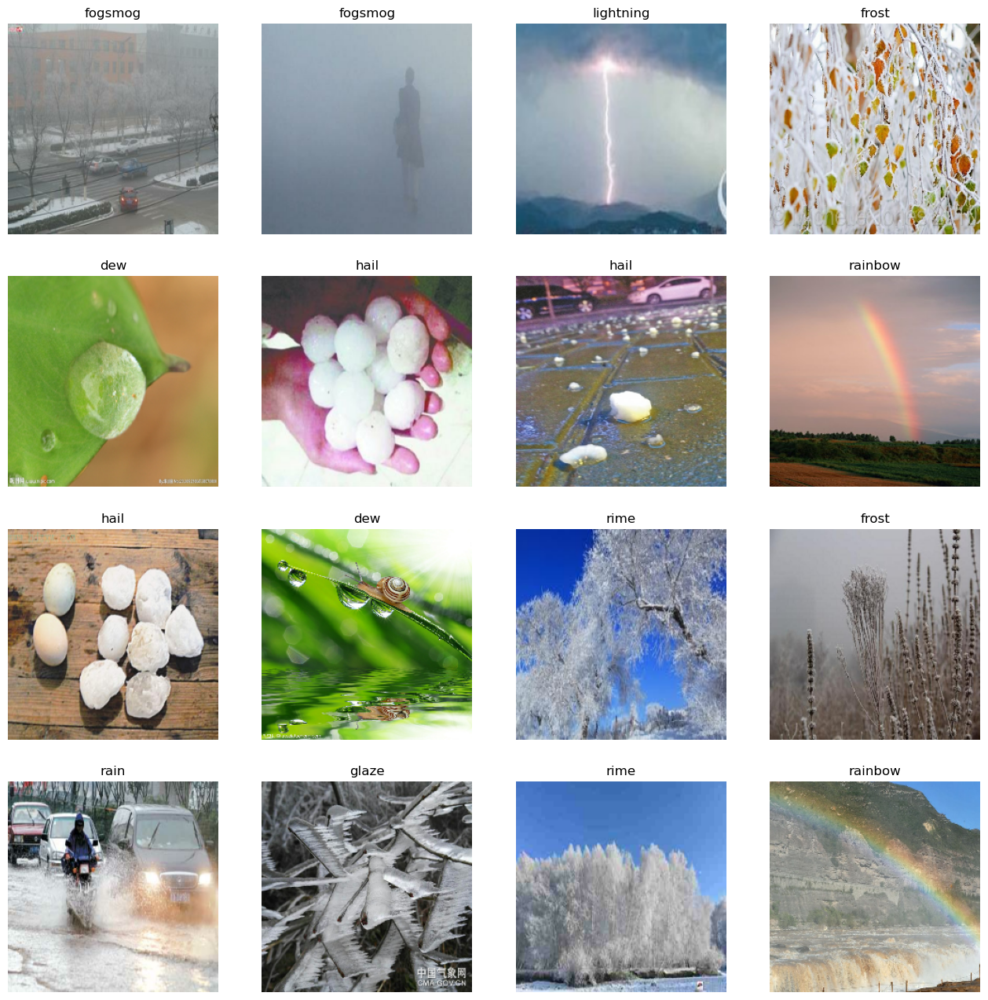

In [ ]:
dataset = tf.keras.utils.image_dataset_from_directory(
  path_to_data,
  image_size=(224, 224),
  batch_size=16,
  shuffle=True,
)
list_img_sample = []
def show_images(dataset):
  plt.figure(figsize=(16,16))
  for images, labels in dataset.take(1):
    for i in range(16):
      ax = plt.subplot(4, 4, i + 1)
      image = images[i].numpy().astype("uint8")
      label = dataset.class_names[labels[i]]
      list_img_sample.append((image, label))
      ax.imshow(image)
      ax.set_title(label)
      ax.axis("off")
  plt.show()

show_images(dataset)

## 2.5 Data Augmentation và phân tách dataset

In [ ]:
input_sizes = (224, 224)
batch_size = 32

In [ ]:
train_val_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 20,
    horizontal_flip = True,
    zoom_range = 0.2,
    validation_split = 0.2
)

train_set = train_val_generator.flow_from_directory(
    path_to_data,
    target_size=input_sizes,
    class_mode='binary',
    batch_size= batch_size,
    shuffle=True,
    subset='training')

valid_set = train_val_generator.flow_from_directory(
    path_to_data,
    target_size=input_sizes,
    class_mode='binary',
    batch_size= batch_size,
    shuffle=True,
    subset='validation')


Found 5493 images belonging to 11 classes.
Found 1369 images belonging to 11 classes.


# III. Khám phá quá trình feature extraction

Trước khi đi vào huấn luyện mô hình trên tập dữ liệu trên, ta tiến hành khám phá lớp rút trích đặc trưng từ backbone MobileNet đã được train sẵn dựa trên tập dữ liệu ImageNet.

## 3.1 Tạo feature extracter từ pre-trained model

In [ ]:
preprocess_methods = app.mobilenet.preprocess_input
backbone = "MobileNet"
feature_extracter = MobileNet(include_top=False, weights='imagenet', input_shape=(224,224,3))

In [ ]:
feature_extracter.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                         

## 3.2. Liệt kê output layer của từng MobileNet Block

* Ta nhận thấy các layer đầu ra của mỗi MobileNet Block là các Relu Activation Layer. Tên của các layer này bắt đầu bằng chuỗi kí tự "conv_pw_" và kết thức bằng chuỗi "relu". Trong đó, "pw" viết tắt cho Pointwise Convolution.
* Kết quả đầu ra của các lớp Relu này chính là activation value của đầu ra các lớp Pointwise Convolution Layer sau khi đã thực hiện bước chuẩn hóa (thông qua lớp Batch Normalization).

In [ ]:
list_name_layer = []
for i in range(len(feature_extracter.layers)):
    layer = feature_extracter.layers[i]
    if "conv_pw" in layer.name and "_relu" in layer.name:
        list_name_layer.append(layer.name)
        print(layer.name , layer.output.shape)


conv_pw_1_relu (None, 112, 112, 64)
conv_pw_2_relu (None, 56, 56, 128)
conv_pw_3_relu (None, 56, 56, 128)
conv_pw_4_relu (None, 28, 28, 256)
conv_pw_5_relu (None, 28, 28, 256)
conv_pw_6_relu (None, 14, 14, 512)
conv_pw_7_relu (None, 14, 14, 512)
conv_pw_8_relu (None, 14, 14, 512)
conv_pw_9_relu (None, 14, 14, 512)
conv_pw_10_relu (None, 14, 14, 512)
conv_pw_11_relu (None, 14, 14, 512)
conv_pw_12_relu (None, 7, 7, 1024)
conv_pw_13_relu (None, 7, 7, 1024)


## 3.3 Visualize feature maps từ một số MobileNet Block

**Tạo feature map extractor**
* Ta đánh chỉ số các layer trên tương ứng chỉ chỉ số block mà nó thuộc về. Các layer được chọn để show feature map output là các layer của block 1, 3, 5, 7, 9, 11, 13.
* Đầu ra của feature map extractor sẽ là tập hợp các output từ các layer được chọn, đầu vào là ảnh mà ta muốn rút trích đặc trưng. Như vậy output của feature map extractor là tensor 4 chiều.

In [ ]:
layer_index = [1, 3 , 5 , 7 , 9, 11, 13]
outputs = [feature_extracter.layers[i-1].output for i in layer_index]
feature_map_extracter = Model( inputs= feature_extracter.inputs, outputs = outputs)


**Chọn ngẫu nhiên một ảnh trong tập mẫu**

Text(0.5, 1.0, 'dew')

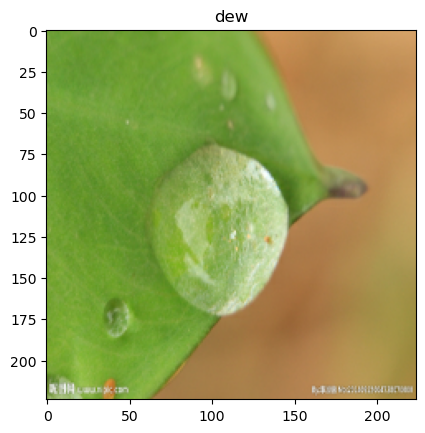

In [ ]:
import random
ran_num = random.randint(0,16)
image, label = list_img_sample[ran_num][0], list_img_sample[ran_num][1]
plt.imshow(image)
plt.subplot(1,1,1).set_title(label)

**Visualize feature map của ảnh được chọn**

1/1 [==============================] - 0s 251ms/step


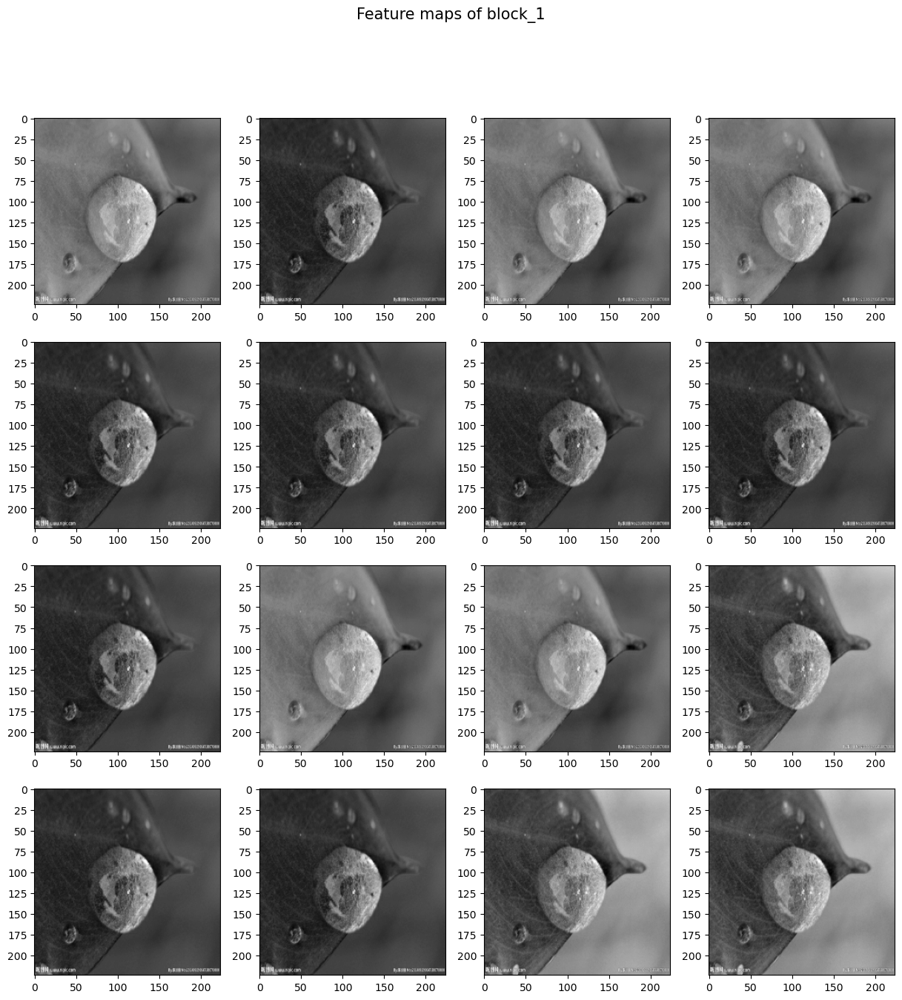

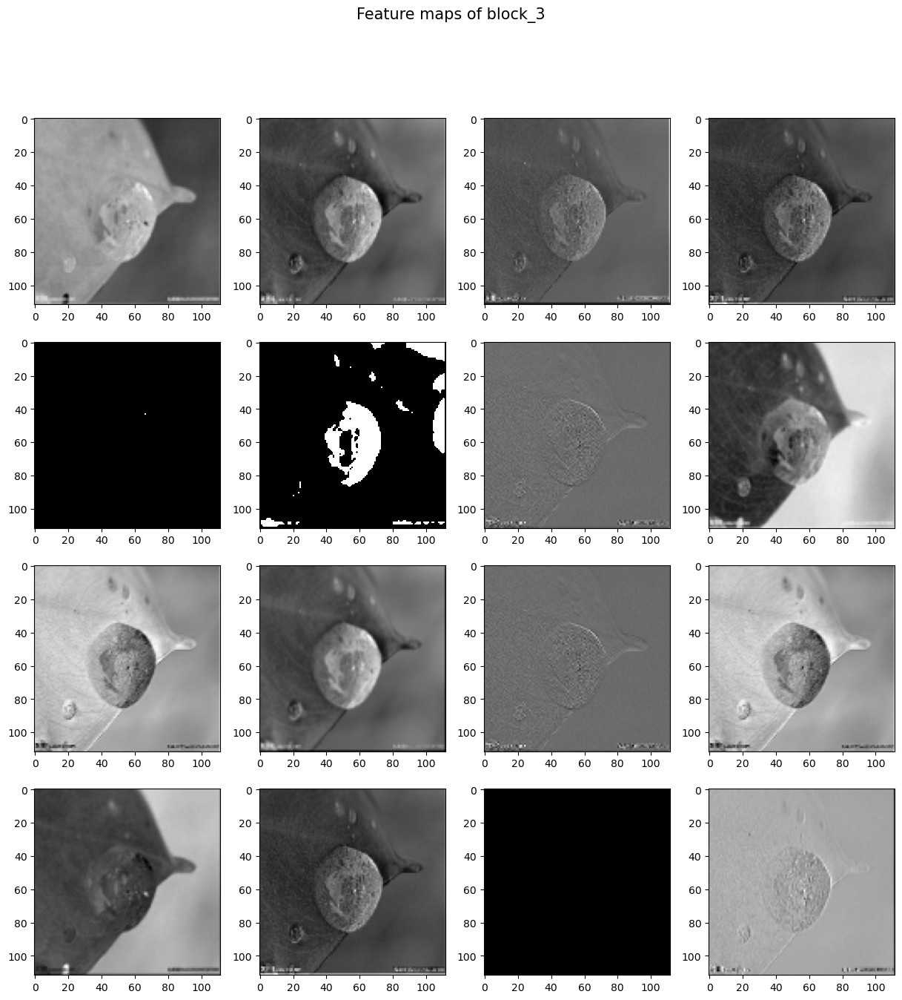

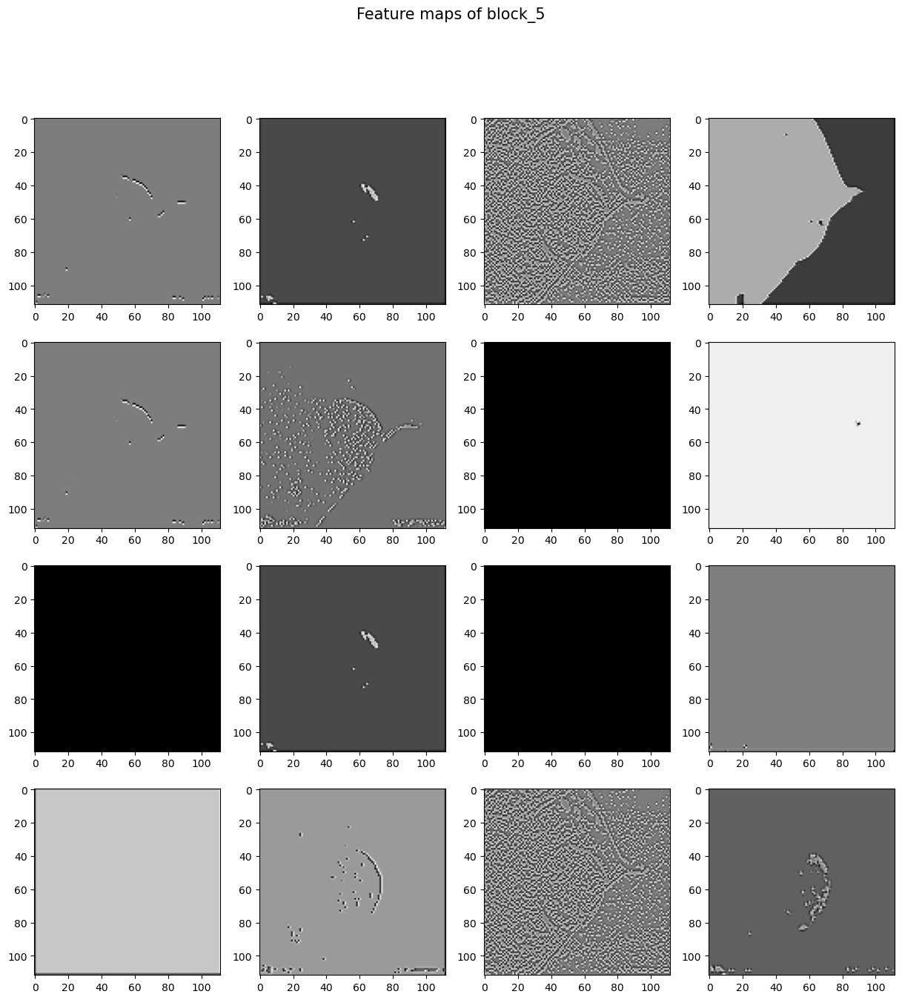

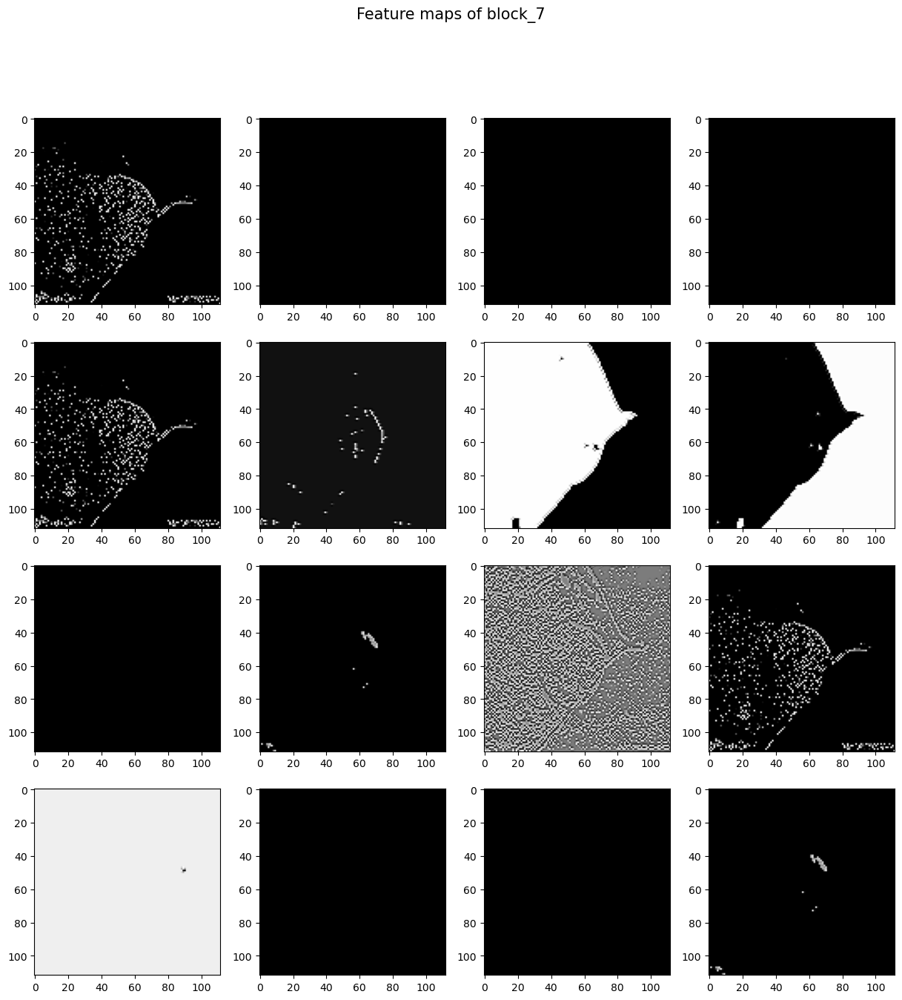

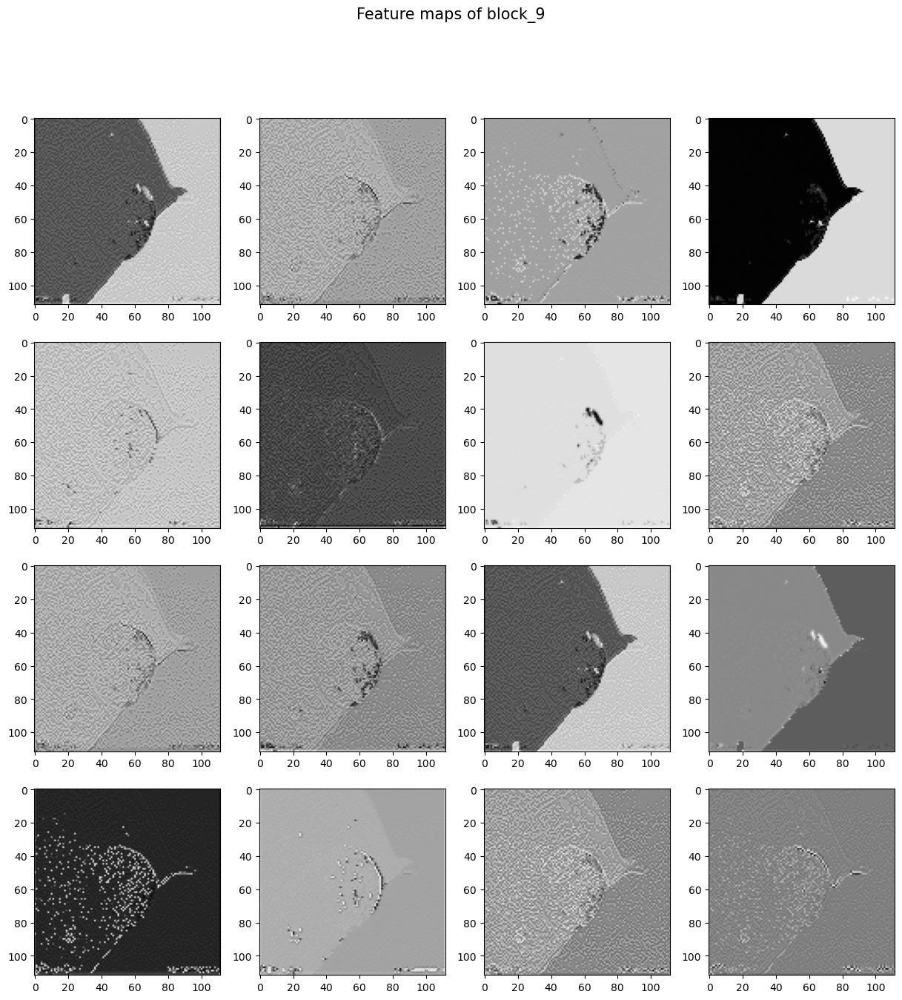

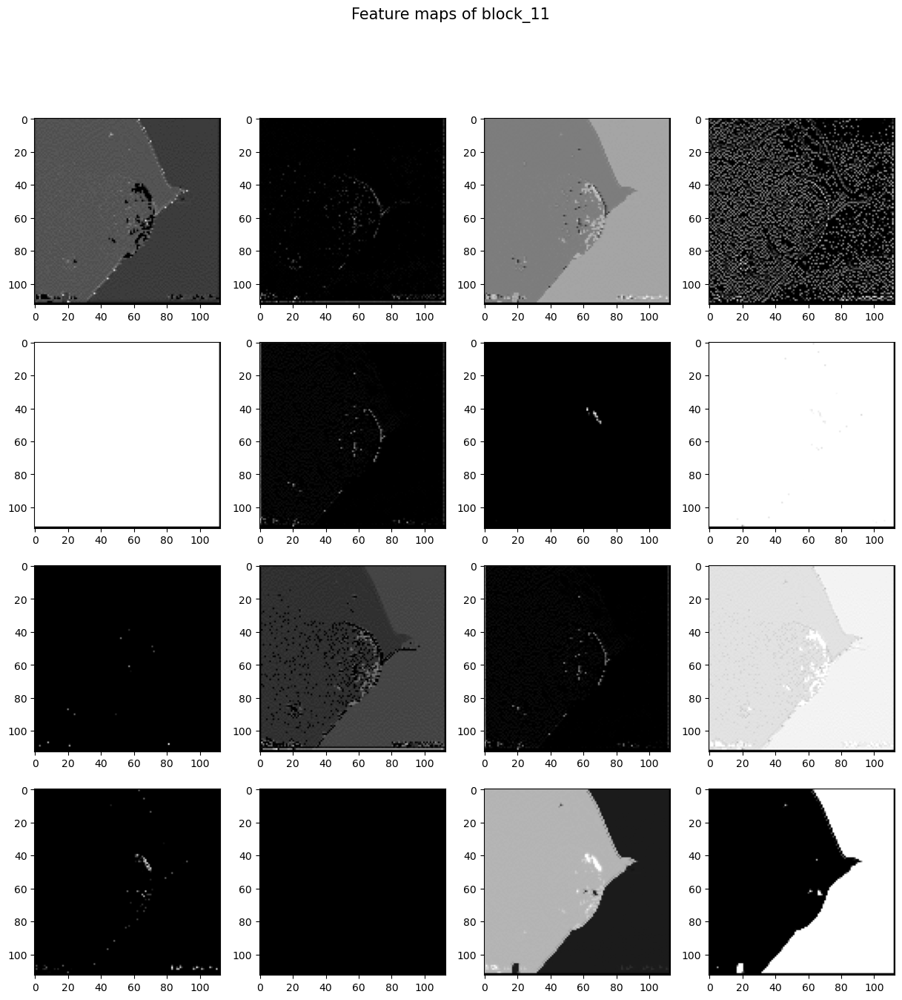

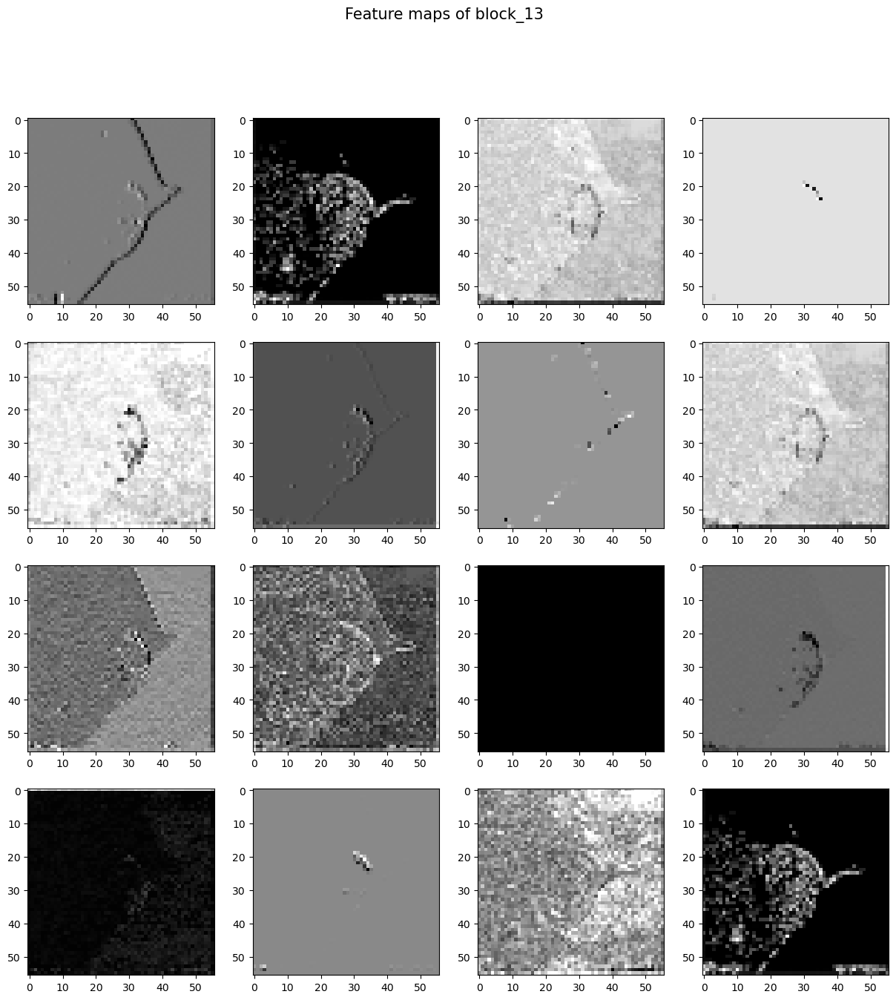

In [ ]:
feature_map_volumes = feature_map_extracter.predict(image.reshape(1, 224, 224, 3))
for i, feature_maps in zip(layer_index, feature_map_volumes):
    fig = plt.figure(figsize=(15, 15))
    fig.suptitle("Feature maps of block_{}".format(i), fontsize=15)
    for i in range(0, len(feature_maps)):
        for j in range(0, 16):
            ran_num = random.randint(0, feature_maps.shape[3] - 1)
            plt.subplot(4,4,j+1)
            plt.imshow(feature_maps[0,:,:,ran_num], cmap = 'gray')
        plt.show()

# IV. Huấn luyện mô hình với pre-trained model

## 4.1 Tạo mô hình cho việc transfer learning

In [ ]:
backbone_dict = {
    "MobileNet": MobileNet(
                    include_top=False,
                    weights='imagenet',
                    input_shape=(224,224,3)),
    "MobileNetV2": MobileNetV2(
                    include_top=False,
                    weights='imagenet',
                    input_shape=(224,224,3)),
    "VGG16": VGG16(
                    include_top=False,
                    weights='imagenet',
                    input_shape=(224,224,3))
}

def create_pretrained_model(backbone):
    feature_exacture = backbone_dict[backbone]
    feature_exacture.trainable = False
    model = keras.Sequential([
        feature_exacture,
        GAP(),
        Dense(256,activation='relu'),
        Dropout(0.2),
        Dense(num_classes, activation='softmax')
    ], name = backbone)
    return model

model = create_pretrained_model("MobileNet")


* Ở đây, ta sử dụng lại mô hình đã được train sẵn trên tập dữ liệu ImageNet. Ta chỉ tận dụng lại tham số phần feature extractor của mô hình này, và bỏ đi các lớp sau phần này của mô hình có sẵn này.
* Ta tiến hành thêm các lớp bên dưới, trong quá trình train ta chỉ train trọng số tại các lớp này:
  * Lớp Global Average Pooling
  * Lớp Dense với hàm kích hoạt Relu và 256 node.
  * Lớp Dropout với tham số tỉ lệ là 0.2 để tránh overfitting.
  * Lớp Dense với hàm kích hoạt là Softmax.

## 4.2 Huấn luyện mô hình

**Model tuning**

In [ ]:
back_bone = "MobileNet"
#Call backs
cbs = [EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint(back_bone + ".h5", save_best_only=True)]

#Compile Model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

**Training**

In [ ]:


#Train Model
history = model.fit(train_set, validation_data=valid_set, callbacks=cbs, epochs=30, verbose=1)


Epoch 1/30
172/172 [==============================] - 239s 1s/step - loss: 0.7578 - accuracy: 0.7449 - val_loss: 0.4951 - val_accuracy: 0.8276
Epoch 2/30
172/172 [==============================] - 228s 1s/step - loss: 0.4301 - accuracy: 0.8522 - val_loss: 0.4159 - val_accuracy: 0.8576
Epoch 3/30
172/172 [==============================] - 217s 1s/step - loss: 0.3571 - accuracy: 0.8726 - val_loss: 0.4059 - val_accuracy: 0.8546
Epoch 4/30
172/172 [==============================] - 184s 1s/step - loss: 0.3110 - accuracy: 0.8937 - val_loss: 0.3917 - val_accuracy: 0.8678
Epoch 5/30
172/172 [==============================] - 173s 1s/step - loss: 0.2652 - accuracy: 0.9046 - val_loss: 0.3932 - val_accuracy: 0.8678
Epoch 6/30
172/172 [==============================] - 186s 1s/step - loss: 0.2405 - accuracy: 0.9159 - val_loss: 0.4288 - val_accuracy: 0.8619
Epoch 7/30
172/172 [==============================] - 314s 2s/step - loss: 0.2407 - accuracy: 0.9164 - val_loss: 0.4278 - val_accuracy: 0.8641

* Nhận xét: Quá trình training đã dừng lại epoch thứ 7 nhờ cơ chế Early Stopping, khi mà mô hình đã xuất hiện dấu hiệu của ***overfitting***. Theo thời gian, accuracy của training set ngày càng tăng, và điều này ngược lại đối với validation set. Mô hình đạt độ chính xác tốt nhất trên tập validation set là tại epoch thứ 4. Do ta chỉnh patience bằng 3, sau 3 epoch tiếp theo mà không có độ cải thiện về mặt val-accuracy, cơ chế early stopping được kích hoạt để dừng tại epoch thứ 7.

Training History:
dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


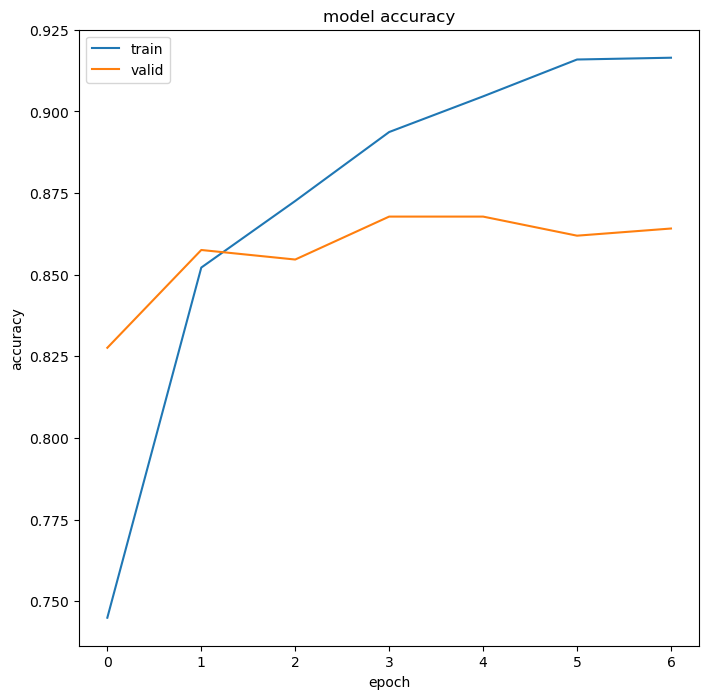

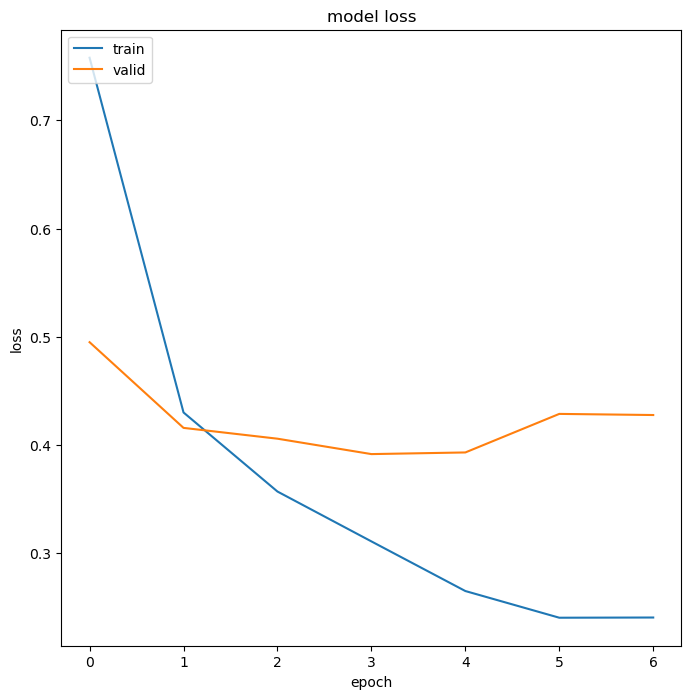

In [ ]:
# list all data in history
print("Training History:")
print(history.history.keys())

# summarize history for accuracy
plt.figure(figsize=(8,8))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()

# summarize history for loss
plt.figure(figsize=(8,8))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()


**Lưu lại lịch sử training**

In [ ]:
import pickle
with open('history', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

## 4.3 Tạo test set

In [ ]:
test_val_generator = ImageDataGenerator(
    rescale = 1./255,
    validation_split = 0.2,
)

test_set = test_val_generator.flow_from_directory(
    path_to_data,
    target_size=input_sizes,
    class_mode='binary',
    batch_size= batch_size,
    shuffle=True,
    subset='validation'
)

Found 1369 images belonging to 11 classes.


## 4.4 Evaluate model dựa trên tập test set

**Load trained model, history file**

In [ ]:
back_bone = "MobileNet"
model_file = "./{:s}.h5".format(back_bone)
trained_model = load_model(model_file)

**Evaluate model**

In [ ]:
trained_model.evaluate(test_set)

43/43 [==============================] - 20s 468ms/step - loss: 0.3644 - accuracy: 0.8692


[0.36438825726509094, 0.8692476153373718]

* Nhận xét: Độ chính xác của model khi dự đoán trên tập test set là khá cao, và không có nhiều sự chênh lệch đối với accuracy trên tập validation.

# V. Dự đoán và phân tích

### 5.1 Dự đoán và lấy thông tin trên toàn bộ test_set

In [ ]:
def predict_and_get_info(dataset, model):
    pred_labels = np.array([])
    ori_labels = np.array([])
    conf_values = np.array([])
    for i in range(0, len(dataset)):
        images = dataset[i][0]
        labels = dataset[i][1]
        probs = model.predict(images)
        conf_values = np.append(conf_values, probs.max(axis=-1))
        pred_labels = np.append(pred_labels, probs.argmax(axis=-1))
        ori_labels = np.append(ori_labels, labels)
    pred_labels = [class_names[int(idx)] for idx in pred_labels]
    ori_labels = [class_names[int(idx)] for idx in ori_labels]
    return pred_labels, ori_labels, conf_values

def get_test_image(test_set, index):
    return test_set[index // batch_size][0][index % batch_size]

pred_labels, ori_labels, conf_values = predict_and_get_info(test_set, trained_model)

1/1 [==============================] - 0s 490ms/step


## 5.2 Hiển thị một số dự đoán có high confidence

**Top 24 ảnh có độ confidence cao nhất**

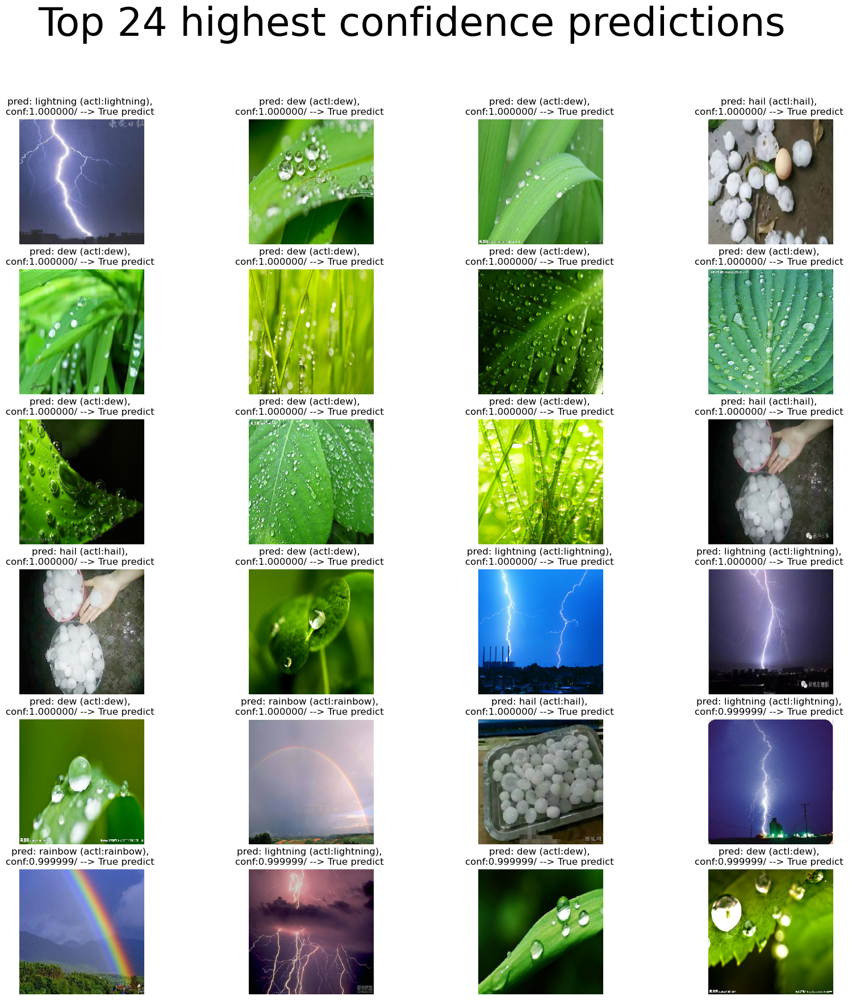

In [ ]:
def show_highest_cfd_pred(test_set, pred_labels, confidence_values, ori_labels, num_top_k, is_revert = False):
    sub_title = "highest" if not is_revert else "lowest"
    image_index_list = (-confidence_values).argsort()[:num_top_k] if not is_revert \
                            else confidence_values.argsort()[:num_top_k]
    plt.figure(figsize=(20, 20))
    for i, j in zip(image_index_list, range(0, num_top_k)):
        ax = plt.subplot(num_top_k // 4, 4, j + 1)
        ax.imshow(get_test_image(test_set, i))
        is_true = str(pred_labels[i] == ori_labels[i]) + ' predict '
        title = "pred: {:s} (actl:{:s}), \nconf:{:f}/ --> {:s}".format(pred_labels[i], ori_labels[i], confidence_values[i], is_true)
        ax.set_title(title)
        ax.axis("off")
        plt.suptitle("Top {:d} {:s} confidence predictions".format(num_top_k, sub_title), fontsize = 50)
    plt.show()

show_highest_cfd_pred(test_set, pred_labels, conf_values, ori_labels, 24)

**Top 24 ảnh có độ confidence thấp nhất**

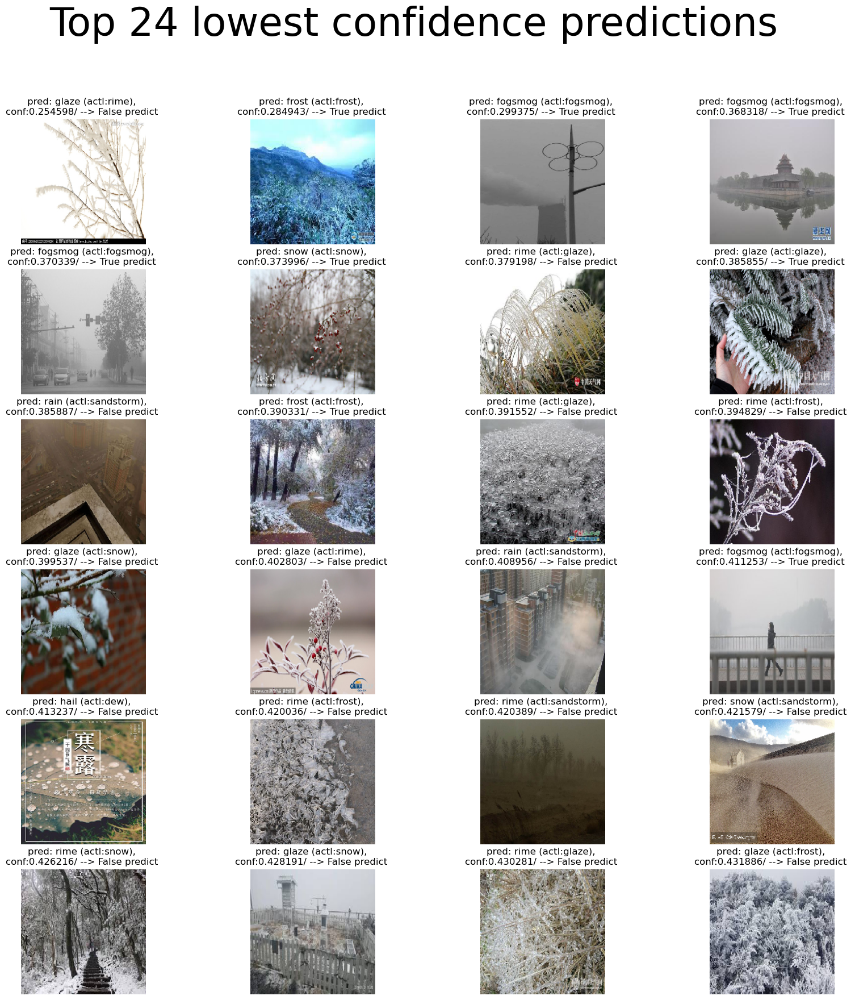

In [ ]:
show_highest_cfd_pred(test_set, pred_labels, conf_values, ori_labels, 24, is_revert = True)

## 5.3 Normalization Confusion Matrix

**Hiển thị ma trận confusion matrix**

<Figure size 640x480 with 0 Axes>

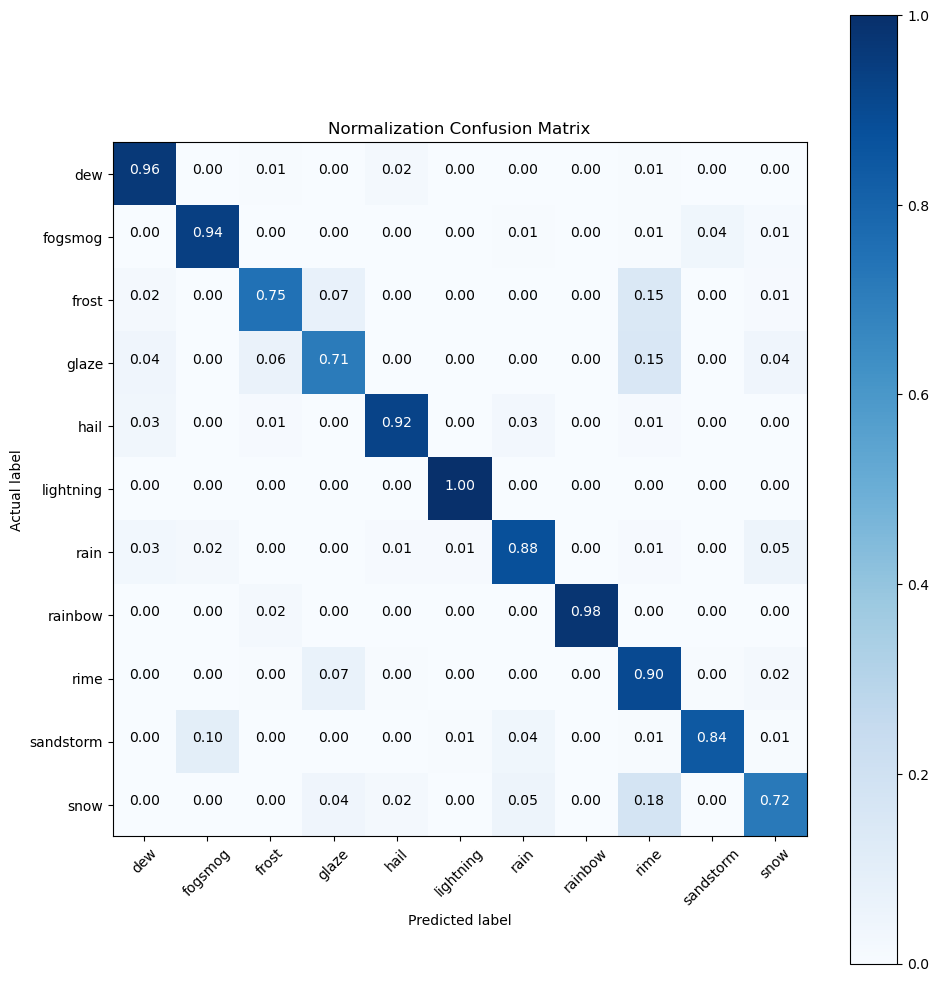

In [ ]:
def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
    plt.figure(figsize = (10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], '.2f'),
                horizontalalignment="center",
                color="white" if cm[i, j] > cm.max() / 2. else "black")
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

cnf_matrix = confusion_matrix(ori_labels, pred_labels)
np.set_printoptions(precision = 3)
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, title='Normalization Confusion Matrix')
plt.show()


* Nhận xét: Quan sát đường chéo chính của ma trận, nhìn chung mô hình hoạt động tốt dựa trên bộ test set. Những trường hợp mà mô hình nhầm lẫn thường là các ảnh được gán nhãn là frost/glaze/snow nhưng bị đoán nhầm là rime. Điều này cũng dễ hiểu khi các thời tiết này có nhiều đặc điểm chung, khó phân biệt bởi mắt người. Đặc biệt, dữ liệu ban đầu có tính chất imbalanced, và có sự bias đối với lớp rime.

# 5.4 Precision, recall và F1-score

In [ ]:
report = classification_report(ori_labels, pred_labels, output_dict=True)
df = pd.DataFrame(report).transpose().drop(columns ="support")
df.style.background_gradient()

,precision,recall,f1-score
dew,0.905405,0.964029,0.933798
fogsmog,0.909091,0.941176,0.924855
frost,0.855422,0.747368,0.797753
glaze,0.762712,0.708661,0.734694
hail,0.939655,0.923729,0.931624
lightning,0.974026,1.000000,0.986842
rain,0.859813,0.876190,0.867925
rainbow,1.000000,0.978261,0.989011
rime,0.776952,0.900862,0.834331
sandstorm,0.943089,0.840580,0.888889


* Nhận xét: Độ chính xác khi dự đoán của mô hình đối với các ảnh thuộc lớp glaze, snow, frost, rime vẫn còn thấp so với mặt chung. Quan sát lại ma trận confusion, các lớp này rất dễ nhầm lẫn qua lại với nhau.

**Những ảnh bị đoán nhầm nhưng có độ confidence cao**

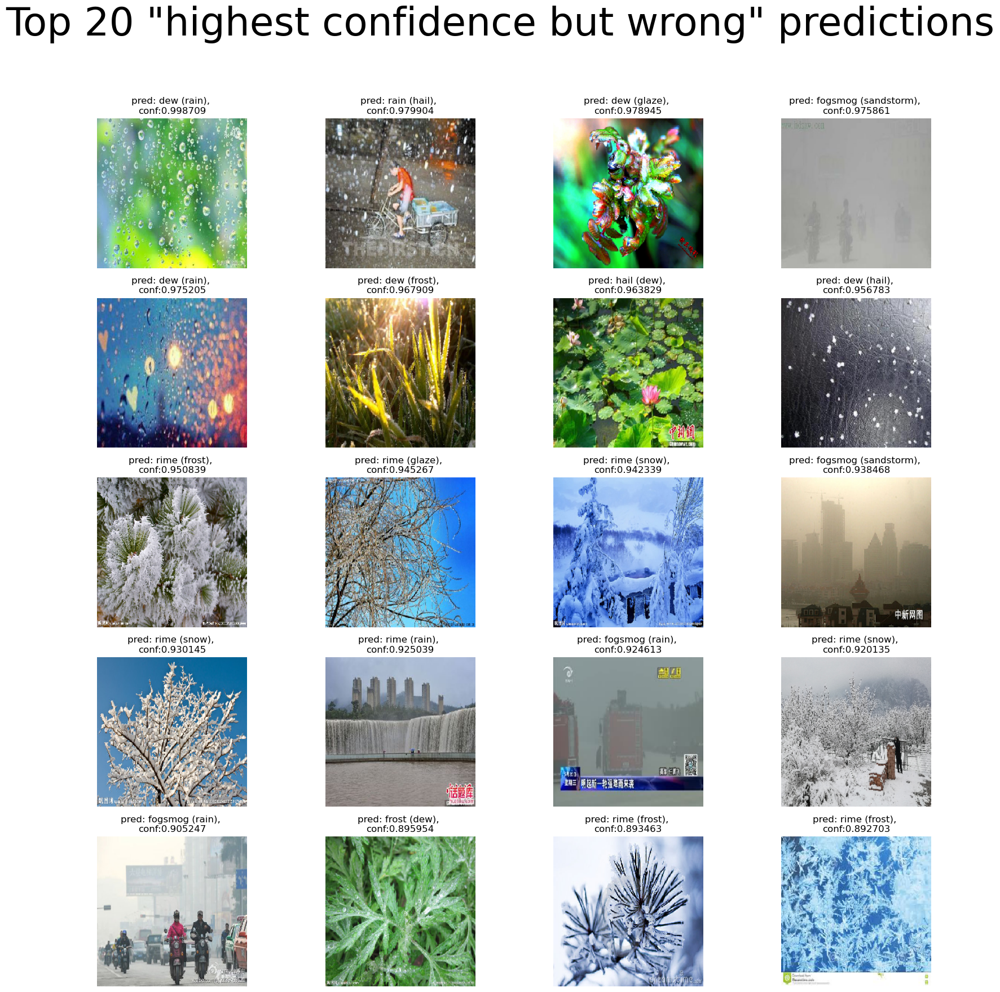

In [ ]:
def show_wrong_pred_high_cfd(test_set, pred_labels, ori_labels, confidence_values, num_show):
    highest_confidence_index = (-confidence_values).argsort()
    plt.figure(figsize=(20, 20))
    count = 0
    for i in highest_confidence_index:
        if pred_labels[i] == ori_labels[i]:
            continue
        ax = plt.subplot(num_show // 4, 4, count + 1)
        ax.imshow(get_test_image(test_set, i))
        title = "pred: {:s} ({:s}), \nconf:{:f}".format(pred_labels[i], ori_labels[i], confidence_values[i])
        ax.set_title(title)
        ax.axis("off")
        plt.suptitle("Top {:d} \"highest confidence but wrong\" predictions".format(num_show), fontsize = 50)
        count += 1
        if count == num_show: break
    plt.show()
show_wrong_pred_high_cfd(test_set, pred_labels, ori_labels, conf_values, 20)

# VI. So sánh MobileNetV1 với một số mạng khác

## 6.1 So sánh với mô hình MobileNetV2

### 6.1.1 Cải tiến của MobileNetV2 so với MobileNetV1

MobileNetV2 là một trong những kiến trúc được ưa chuộng nhất khi phát triển các ứng dụng AI trong computer vision như SSDLite trong object detection và DeepLabV3 image segmentation. MobileNetV2 có một số điểm cải tiến so với MobileNetV1 giúp cho nó có độ chính xác cao hơn, số lượng tham số và số lượng các phép tính ít hơn.

**Inverted Residual Block**

* MobileNetV2 cũng sử dụng Residuals Block như mạng ResNet. Đặc điểm của khối Residuals Block truyền thống là các kết "nối tắt": input từ một layer thứ $i$ có thể truyền đến và cộng thằng vào input của layer $i + k$ với $k > 1$. Cơ chế này của Residual Block giúp hạn chế vanish gradient của việc chỉ truyền mỗi output của một lớp liền trước làm input của lớp liền sau.
* Để phù hợp với nhu cầu là một "lightweight model", kiến trúc này đã cải tiến Residual Block ở các kết nối tắt sao cho số input và output channels của mỗi block được thắt hẹp lại. Chính vì thế nó được gọi là các bottleneck layers.
* Residual block của MobileNetV2 ngược lại so với các kiến trúc Residuals Block truyền thống, vì kiến trúc truyền thống có số lượng kênh ở input và output của một block lớn hơn so với các layer trung gian. Chính vì vậy nó còn được gọi là Inverted residual block.
* Ở giữa các layer trong một block Inverted Residual Block chúng ta cũng sử dụng những biến đổi Depthwise Separable Convolution để giảm thiểu số lượng tham số của mô hình, cơ chế giúp họ các model MobileNet có kích thước giảm nhẹ.

<img width="500" height="400" src = "https://www.researchgate.net/publication/335779524/figure/fig7/AS:802472356499457@1568335727698/The-difference-between-residual-block-a-and-inverted-residual-b.png">

**Loại bỏ non-linear ở đầu ra các block**

* Thực nghiệm được tác giả ghi nhận đó là việc sử dụng các biến đổi phi tuyến (như biến đổi qua ReLu hoặc sigmoid) tại input và output của các Residual Block sẽ làm cho thông tin bị mất mát. Do đó các phép biến đổi non-linear thay bằng các phép chiếu tuyến tính.

<img width="500" height="400" src = "https://www.researchgate.net/publication/342922550/figure/fig2/AS:929062851731456@1598517253116/Comparison-between-the-residual-block-and-linear-bottleneck-block.png">

### 6.1.2 Huấn luyện, đánh giá và so sánh

In [ ]:
cbs = [EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint("MobileNetV2" + ".h5", save_best_only=True)]
mb2_model = create_pretrained_model("MobileNetV2")
mb2_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
mb2_history = mb2_model.fit(train_set, validation_data=valid_set, callbacks=cbs, epochs=30, verbose=1)

Epoch 1/30
172/172 [==============================] - 291s 2s/step - loss: 0.8849 - accuracy: 0.6918 - val_loss: 0.6187 - val_accuracy: 0.7918
Epoch 2/30
172/172 [==============================] - 438s 3s/step - loss: 0.5585 - accuracy: 0.7946 - val_loss: 0.5172 - val_accuracy: 0.8130
Epoch 3/30
172/172 [==============================] - 311s 2s/step - loss: 0.4813 - accuracy: 0.8265 - val_loss: 0.5283 - val_accuracy: 0.8115
Epoch 4/30
172/172 [==============================] - 396s 2s/step - loss: 0.4459 - accuracy: 0.8340 - val_loss: 0.4989 - val_accuracy: 0.8188
Epoch 5/30
172/172 [==============================] - 406s 2s/step - loss: 0.4009 - accuracy: 0.8575 - val_loss: 0.5232 - val_accuracy: 0.8298
Epoch 6/30
172/172 [==============================] - 408s 2s/step - loss: 0.3668 - accuracy: 0.8618 - val_loss: 0.4905 - val_accuracy: 0.8225
Epoch 7/30
172/172 [==============================] - 400s 2s/step - loss: 0.3602 - accuracy: 0.8660 - val_loss: 0.4967 - val_accuracy: 0.8225

* Nhận xét:
    * Validation accuracy của MobileNetV2 không cao bằng MobileNetV1 (thấp hơn khoảng khoảng 4%), số lượng epoch cần dùng trước khi early stopping cũng cao hơn tới 4 epoch.
    * Như vậy, với bộ dữ liệu này, cùng với các siêu tham số giống nhau ta đã chỉnh cho hai mô hình, thì mô hình MobileNetV1 có performance tốt hơn.

In [ ]:
import pickle
with open('mb2_history', 'wb') as file:
    pickle.dump(mb2_history.history, file)

In [ ]:
with open('history', 'rb') as file:
    mb1_history = pickle.load(file)
with open('mb2_history', 'rb') as file:
    mb2_history = pickle.load(file)

Training History:


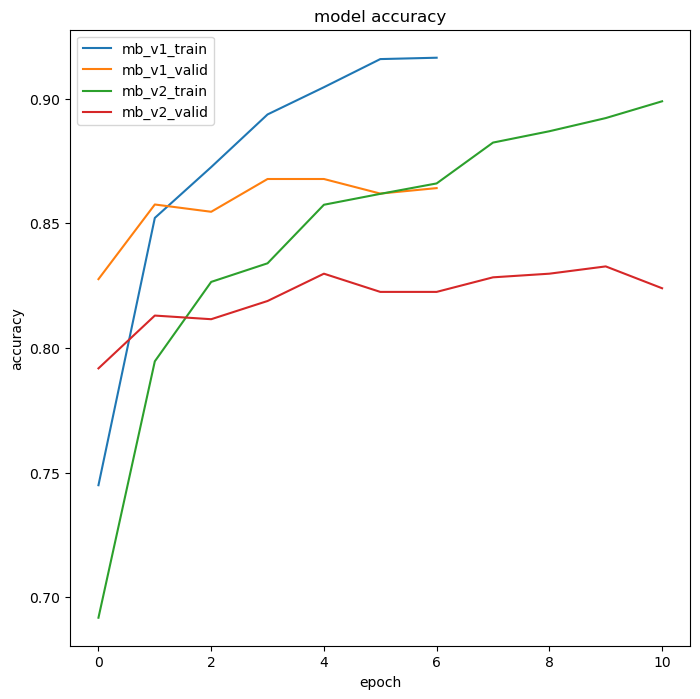

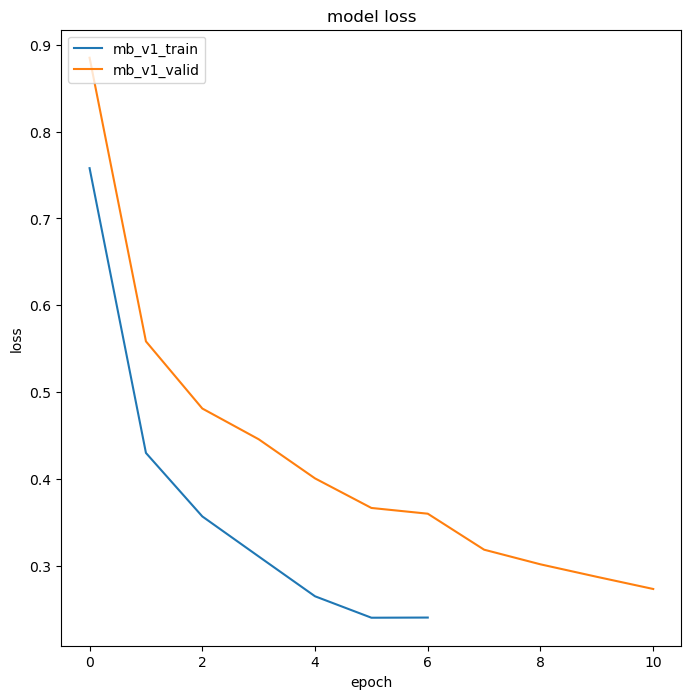

In [ ]:
# list all data in history
print("Training History:")
# summarize history for accuracy
plt.figure(figsize=(8,8))
plt.plot(mb1_history['accuracy'])
plt.plot(mb1_history['val_accuracy'])
plt.plot(mb2_history['accuracy'])
plt.plot(mb2_history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['mb_v1_train', 'mb_v1_valid', 'mb_v2_train', 'mb_v2_valid'], loc='upper left')
plt.show()

# summarize history for loss
plt.figure(figsize=(8,8))
plt.plot(mb1_history['loss'])
plt.plot(mb2_history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['mb_v1_train', 'mb_v1_valid', 'mb_v2_train', 'mb_v2_valid'], loc='upper left')
plt.show()


Training History:


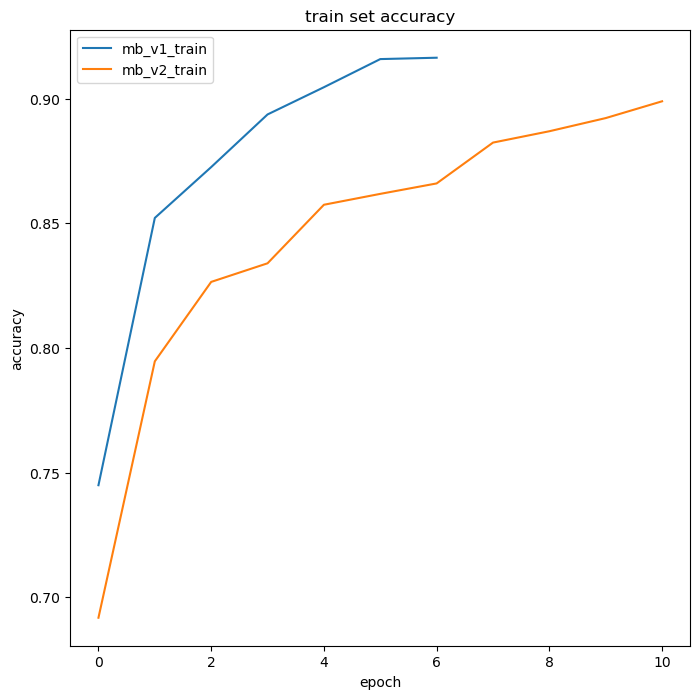

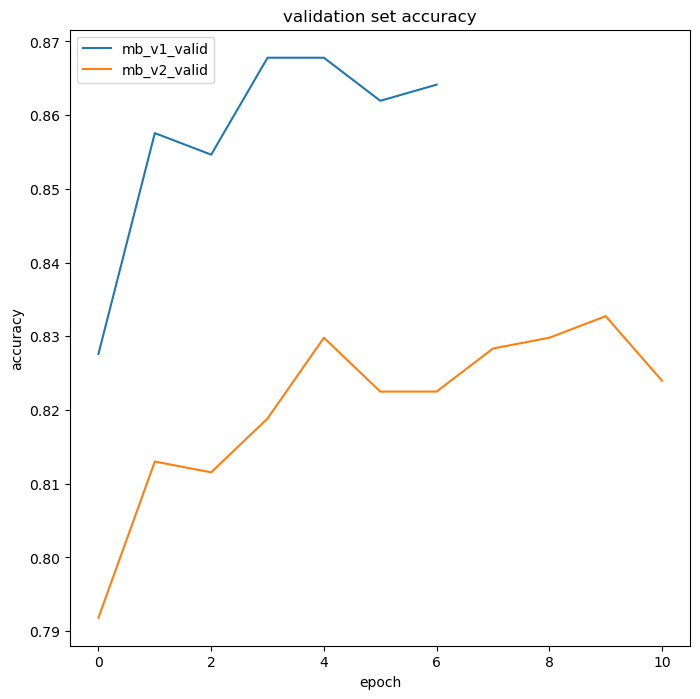

In [ ]:
# list all data in history
print("Training History:")
# summarize history for accuracy
plt.figure(figsize=(8,8))
plt.plot(mb1_history['accuracy'])
plt.plot(mb2_history['accuracy'])
plt.title('train set accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['mb_v1_train', 'mb_v2_train'], loc='upper left')
plt.show()

plt.figure(figsize=(8,8))
plt.plot(mb1_history['val_accuracy'])
plt.plot(mb2_history['val_accuracy'])
plt.title('validation set accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['mb_v1_valid', 'mb_v2_valid'], loc='upper left')
plt.show()


## 6.2 So sánh với VGG16

### 6.2.1 Huấn luyện và so sánh

In [ ]:
cbs = [EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint("VGG16" + ".h5", save_best_only=True)]
vgg16_model = create_pretrained_model("VGG16")
vgg16_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
vgg16_history = vgg16_model.fit(train_set, validation_data=valid_set, callbacks=cbs, epochs=30, verbose=1)

Epoch 1/30
172/172 [==============================] - 860s 5s/step - loss: 1.5559 - accuracy: 0.4706 - val_loss: 1.1051 - val_accuracy: 0.6669
Epoch 2/30
172/172 [==============================] - 924s 5s/step - loss: 1.0534 - accuracy: 0.6412 - val_loss: 0.9091 - val_accuracy: 0.6983
Epoch 3/30
172/172 [==============================] - 916s 5s/step - loss: 0.8826 - accuracy: 0.6980 - val_loss: 0.7990 - val_accuracy: 0.7370
Epoch 4/30
172/172 [==============================] - 788s 5s/step - loss: 0.8056 - accuracy: 0.7195 - val_loss: 0.7900 - val_accuracy: 0.7027
Epoch 5/30
172/172 [==============================] - 773s 4s/step - loss: 0.7394 - accuracy: 0.7364 - val_loss: 0.7136 - val_accuracy: 0.7604
Epoch 6/30
172/172 [==============================] - 773s 4s/step - loss: 0.6962 - accuracy: 0.7528 - val_loss: 0.6891 - val_accuracy: 0.7714
Epoch 7/30
172/172 [==============================] - 772s 4s/step - loss: 0.6689 - accuracy: 0.7673 - val_loss: 0.7063 - val_accuracy: 0.7575

### 6.2 Kết luận

* Nhận xét:
    * VGG16 có khối lượng tính toán lớn và thời gian train mỗi epoch lớn gấp ít nhất 4-5 lần so với các mạng trong lớp mạng MobileNet.
    * Mô hình này đã được train trong 4h liên tục, dùng bộ optimizer là Adam, các hyperparameter được cài như các mô hình trước, nhưng kết quả vẫn không khả quan so với mô hình Mobile trước khi bị cho dừng lại.
    * Performance của MobileNetV1 trên bộ dataset này tốt hơn so với mô hình kế cận nó là MobileNetV2. So với VGG16, các mô hình lớp mạng MobileNet tỏ ra hiệu quả hơn nhiều lần về mặt thời gian, số lượng tham số và khối lượng tính toán.  